In this notebook, we are building Generative Adversarial Network to restore clean images from noisy images as present in the dataset "humanface8000". The Generator network has a UNet Architecture.

## 1. Import necessary libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import PIL
import time

import tensorflow as tf
from tensorflow.keras import layers
from tqdm import tqdm

2024-04-15 22:19:41.207148: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-15 22:19:41.207288: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-15 22:19:41.312975: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## 2. View a sample image from the dataset

(500, 362, 3) (256, 256, 3)
255 0 255 0


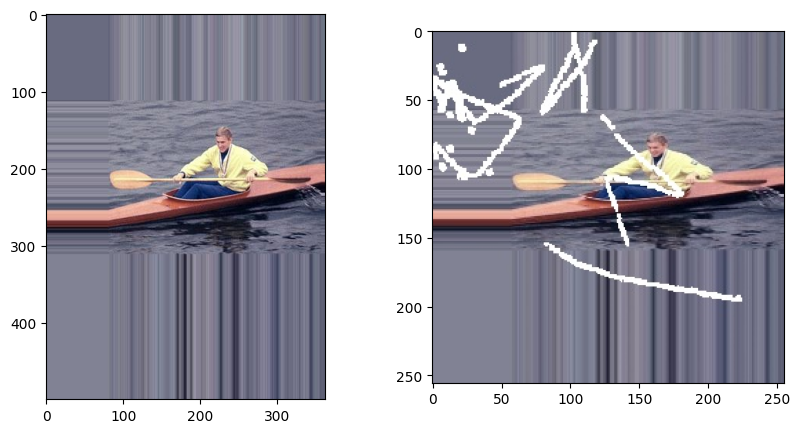

In [2]:
image_color = PIL.Image.open("/kaggle/input/humanface8000/landscape Images/color/10002.jpg")
image_gray = PIL.Image.open("/kaggle/input/humanface8000/landscape Images/gray/10002.jpg")

print(np.array(image_color).shape, np.array(image_gray).shape)
print(np.max(image_color), np.min(image_color), np.max(image_gray), np.min(image_gray))
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(image_color)

plt.subplot(1,2,2)
plt.imshow(image_gray)

## 3. Load the dataset

The dataset is load using the function "image_dataset_from_directory" in batches of size 64. The dataset is splitted into 90-10 train-test subsets.

The images are then scaled to the range (0-1) for efficient computation.

In [3]:
color_dir = '/kaggle/input/humanface8000/landscape Images/color/'
gray_dir = '/kaggle/input/humanface8000/landscape Images/gray/'

img_height, img_width = 256, 256
batch_size = 64

color_train_dataset = tf.keras.utils.image_dataset_from_directory(
    color_dir, labels=None,
    validation_split=0.1,
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

color_test_dataset = tf.keras.utils.image_dataset_from_directory(
    color_dir, labels=None,
    validation_split=0.1,
    subset="validation",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

gray_train_dataset = tf.keras.utils.image_dataset_from_directory(
    gray_dir, labels=None,
    validation_split=0.1,
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

gray_test_dataset = tf.keras.utils.image_dataset_from_directory(
    gray_dir, labels=None,
    validation_split=0.1,
    subset="validation",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

normalization_layer = tf.keras.layers.Rescaling(1./255)
color_train_dataset = color_train_dataset.map(lambda x: normalization_layer(x))
color_test_dataset = color_test_dataset.map(lambda x: normalization_layer(x))
gray_train_dataset = gray_train_dataset.map(lambda x: normalization_layer(x))
gray_test_dataset = gray_test_dataset.map(lambda x: normalization_layer(x))


train_dataset = tf.data.Dataset.zip((color_train_dataset, gray_train_dataset))
test_dataset = tf.data.Dataset.zip((color_test_dataset, gray_test_dataset))

Found 8164 files.
Using 7348 files for training.
Found 8164 files.
Using 816 files for validation.
Found 8164 files.
Using 7348 files for training.
Found 8164 files.
Using 816 files for validation.


## 4. Visualize images from the training and testing dataset

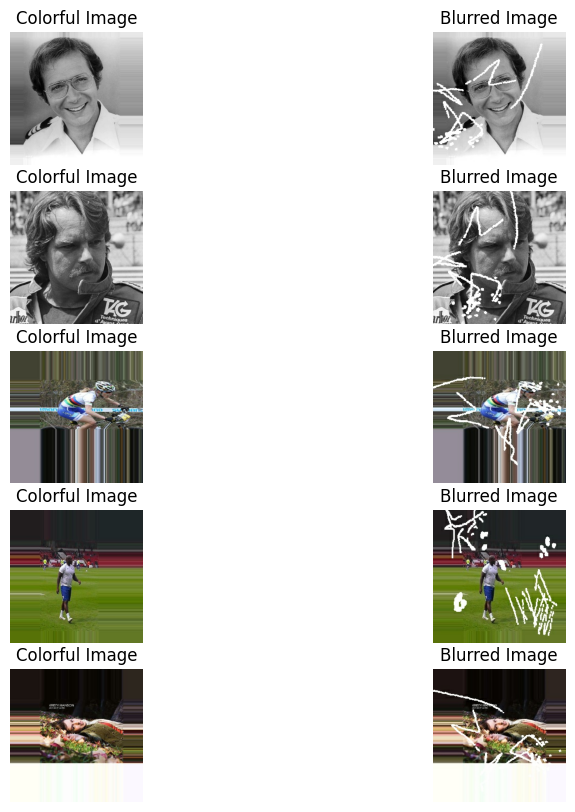

(64, 256, 256, 3) (64, 256, 256, 3)


In [4]:
for (color_images, blur_images) in train_dataset.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(5):
        plt.subplot(5, 2, 2*i + 1)
        plt.imshow(color_images[i])
        plt.axis('off')
        plt.title('Colorful Image')
        
        plt.subplot(5, 2, 2*i + 2)
        plt.imshow(blur_images[i]) 
        plt.axis('off')
        plt.title('Blurred Image')
    plt.show()
    print(color_images.shape, blur_images.shape)

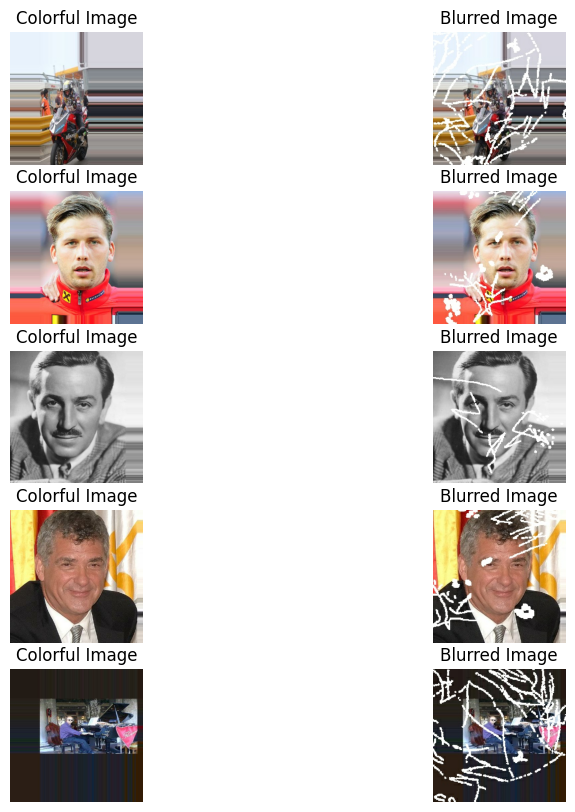

(64, 256, 256, 3) (64, 256, 256, 3)


In [5]:
for (color_images, blur_images) in test_dataset.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(5):
        plt.subplot(5, 2, 2*i + 1)
        plt.imshow(color_images[i])
        plt.axis('off')
        plt.title('Colorful Image')
        
        plt.subplot(5, 2, 2*i + 2)
        plt.imshow(blur_images[i]) 
        plt.axis('off')
        plt.title('Blurred Image')
    plt.show()
    print(color_images.shape, blur_images.shape)

## 5. GAN Model

### 5.1 UNet Architecture

In [6]:
def downsample(filters, size, apply_batchnorm=True):
    result = tf.keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer='he_normal', use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())
    return result

def upsample(filters, size, apply_dropout=False):
    result = tf.keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                    padding='same',kernel_initializer='he_normal',use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result 

### 5.2 Generator Model

In [7]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256,256,3])

    down_stack = [
        downsample(64, 3, apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 3), # (bs, 64, 64, 128)
        downsample(128, 3), # (bs, 32, 32, 128)
        downsample(256, 3), # (bs, 16, 16, 256)
        downsample(256, 3), # (bs, 8, 8, 256)
        downsample(512, 3), # (bs, 4, 4, 512)
        downsample(512, 3), # (bs, 2, 2, 512)
        downsample(512, 3), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 3, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 3, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(256, 3, apply_dropout=True), # (bs, 8, 8, 512)
        upsample(256, 3), # (bs, 16, 16, 512)
        upsample(128, 3), # (bs, 32, 32, 256)
        upsample(128, 3), # (bs, 64, 64, 256)
        upsample(64, 3), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(3, 5, strides=2,
                    padding='same',kernel_initializer=initializer,activation='relu') # (bs, 256, 256, 3)

    x = inputs

    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [8]:
generator = Generator()
generator.summary()

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      1,728 │ input_layer[0][0] │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │     74,240 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    147,968 │ sequential_1[0][… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 16, 16,    │    295,936 │ sequential_2[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 8, 8, 256) │    590,848 │ sequential_3[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 4, 4, 512) │  1,181,696 │ sequential_4[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 2, 2, 512) │  2,361,344 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 1, 1, 512) │  2,361,344 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  2,361,344 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2, 2,      │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_6[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 4, 4, 512) │  4,720,640 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 4, 4,      │          0 │ sequential_9[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_5[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 8, 8, 256) │  2,360,320 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 8, 8, 512) │          0 │ sequential_10[0]… │
│ (Concatenate)       │                   │            │ sequential_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 16, 16,    │  1,180,672 │ concatenate_2[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 16, 16,    │          0 │ sequential_11[0]

 Total params: 18,681,155 (71.26 MB)

 Trainable params: 18,672,835 (71.23 MB)

 Non-trainable params: 8,320 (32.50 KB)

### 5.3 Discriminator Model

In [9]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')
    tar = layers.Input(shape=[256, 256, 3], name='target_image')

    x = layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

    down1 = downsample(64, 3, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 3)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 3)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 3, strides=1,
                kernel_initializer=initializer, use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    batchnorm1 = layers.BatchNormalization()(conv)
    leaky_relu = layers.LeakyReLU()(batchnorm1)
    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)
    last = layers.Conv2D(1, 3, strides=1,kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
    flat = layers.Flatten()(last)
    out = layers.Dense(1)(flat)
    return tf.keras.Model(inputs=[inp, tar], outputs=out)

In [10]:
discriminator = Discriminator()
discriminator.summary()

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ target_image        │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 256, 256,  │          0 │ input_image[0][0… │
│ (Concatenate)       │ 6)                │            │ target_image[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_15       │ (None, 128, 128,  │      3,456 │ concatenate_7[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_16       │ (None, 64, 64,    │     74,240 │ sequential_15[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_17       │ (None, 32, 32,    │    295,936 │ sequential_16[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 34, 34,    │          0 │ sequential_17[0]… │
│ (ZeroPadding2D)     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 32, 32,    │  1,179,648 │ zero_padding2d[0… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │      2,048 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_11      │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 34, 34,    │          0 │ leaky_re_lu_11[0… │
│ (ZeroPadding2D)     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 32, 32, 1) │      4,609 │ zero_padding2d_1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 1024)      │          0 │ conv2d_12[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 1)         │      1,025 │ flatten[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,560,962 (5.95 MB)

 Trainable params: 1,559,170 (5.95 MB)

 Non-trainable params: 1,792 (7.00 KB)

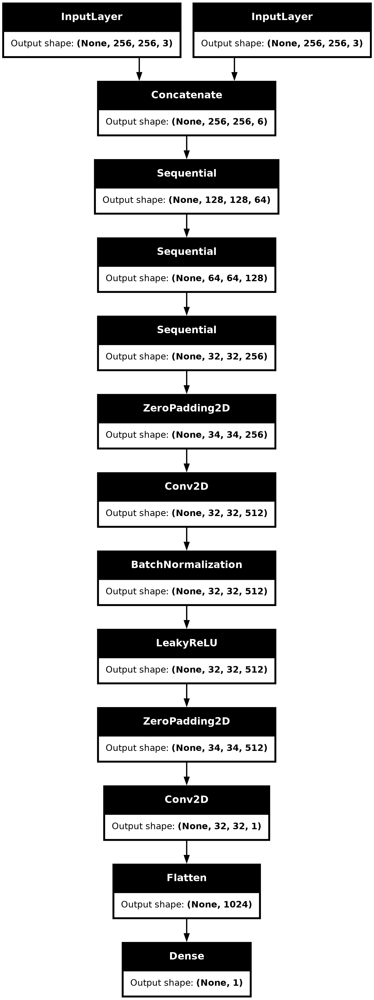

In [11]:
tf.keras.utils.plot_model(generator, to_file= "generator.png", show_shapes=True)
tf.keras.utils.plot_model(discriminator, to_file= "discriminator.png", show_shapes=True)

### 5.4 Loss Functions and Optimizers

In [12]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

LAMBDA = 100

def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

## 6. Training

In [13]:
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,discriminator.trainable_variables))
    return gen_total_loss, disc_loss

A set of 5 images are taken from the test subset and predictions are made on those 5 images which is viewed after every 10 epochs.

In [14]:
def generate_samples(epoch, num=5):
    prediction = generator(blur_images, training = False)
    plt.figure(figsize=(10, num*2))
    for i in range(num):
        plt.subplot(5, 3, 3*i + 1)
        plt.imshow(blur_images[i])
        plt.axis('off')
        plt.title('Noisy Image')
        
        plt.subplot(5, 3, 3*i + 2)
        plt.imshow(color_images[i]) 
        plt.axis('off')
        plt.title('Ground Truth')
        
        plt.subplot(5, 3, 3*i + 3)
        plt.imshow(prediction[i]) 
        plt.axis('off')
        plt.title('Predicted Image')
    plt.savefig("Results after {} th epoch".format(epoch))
    plt.tight_layout()
    plt.show()

for (color_images, blur_images) in test_dataset.take(1):
    color_images = color_images
    blur_images = blur_images

In [15]:
def fit(train_ds, epochs):
    for epoch in range(1,epochs+1):
        start = time.time()

        print("Epoch: ", epoch)
        generator_loss = 0
        discriminator_loss = 0
        for n, (target, input_image) in train_ds.enumerate():
            gen_total_loss, disc_loss = train_step(input_image, target, epoch)
            generator_loss += gen_total_loss
            discriminator_loss += disc_loss
        if epoch%10 == 0:
            generate_samples(epoch)

        print ('Time: {} sec, gen loss = {}, disc loss = {}.'.format(time.time()-start, generator_loss, discriminator_loss))

Epoch:  1
Time: 158.2220618724823 sec, gen loss = 1428.676025390625, disc loss = 156.42727661132812.
Epoch:  2
Time: 137.5791459083557 sec, gen loss = 811.4420776367188, disc loss = 142.71351623535156.
Epoch:  3
Time: 137.83003640174866 sec, gen loss = 717.2218017578125, disc loss = 136.72398376464844.
Epoch:  4
Time: 137.68167281150818 sec, gen loss = 676.3367309570312, disc loss = 137.35011291503906.
Epoch:  5
Time: 137.61091256141663 sec, gen loss = 646.7177124023438, disc loss = 136.12998962402344.
Epoch:  6
Time: 138.87371563911438 sec, gen loss = 624.033447265625, disc loss = 138.01223754882812.
Epoch:  7
Time: 137.48158884048462 sec, gen loss = 592.2660522460938, disc loss = 138.01068115234375.
Epoch:  8
Time: 137.40476512908936 sec, gen loss = 575.9132690429688, disc loss = 140.0471649169922.
Epoch:  9
Time: 138.08738541603088 sec, gen loss = 564.2997436523438, disc loss = 136.7587127685547.
Epoch:  10


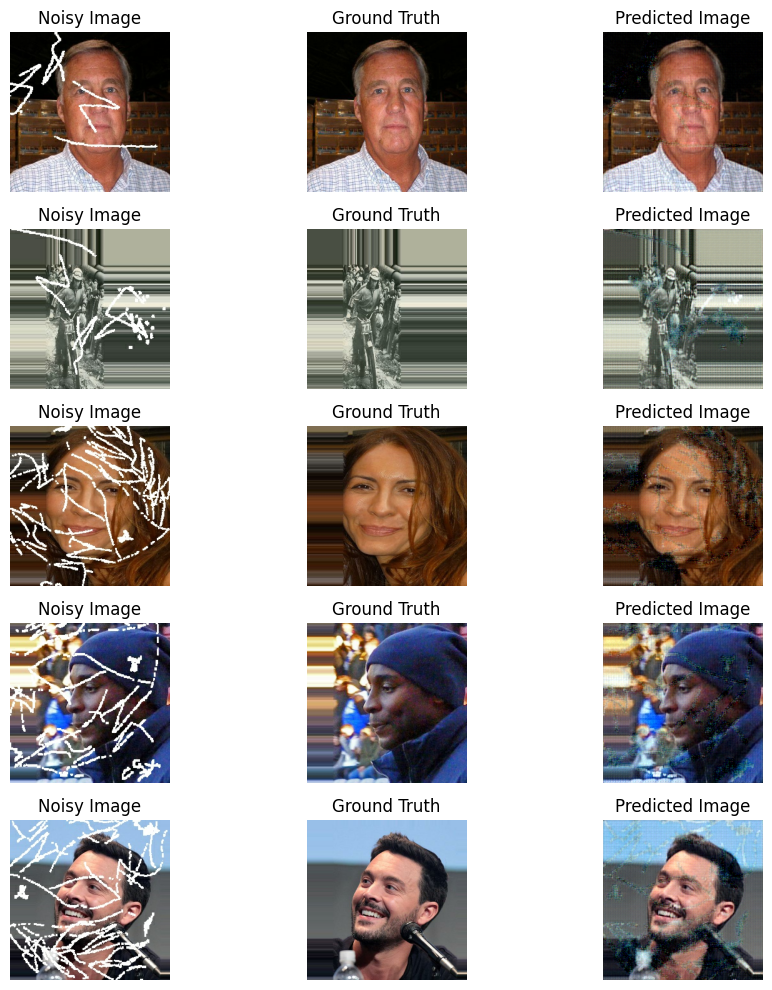

Time: 139.31908559799194 sec, gen loss = 550.5504150390625, disc loss = 140.02450561523438.
Epoch:  11
Time: 137.47770881652832 sec, gen loss = 536.8849487304688, disc loss = 143.85171508789062.
Epoch:  12
Time: 137.95351219177246 sec, gen loss = 516.1115112304688, disc loss = 143.608154296875.
Epoch:  13
Time: 136.5174458026886 sec, gen loss = 516.943359375, disc loss = 142.4136962890625.
Epoch:  14
Time: 137.218736410141 sec, gen loss = 502.8723449707031, disc loss = 145.73065185546875.
Epoch:  15
Time: 136.64531683921814 sec, gen loss = 539.119384765625, disc loss = 139.7919921875.
Epoch:  16
Time: 137.28213143348694 sec, gen loss = 525.1759643554688, disc loss = 139.1943817138672.
Epoch:  17
Time: 137.26574802398682 sec, gen loss = 589.5142822265625, disc loss = 126.46919250488281.
Epoch:  18
Time: 136.83632636070251 sec, gen loss = 583.6513061523438, disc loss = 127.93090057373047.
Epoch:  19
Time: 137.14968872070312 sec, gen loss = 585.8301391601562, disc loss = 116.3604202270507

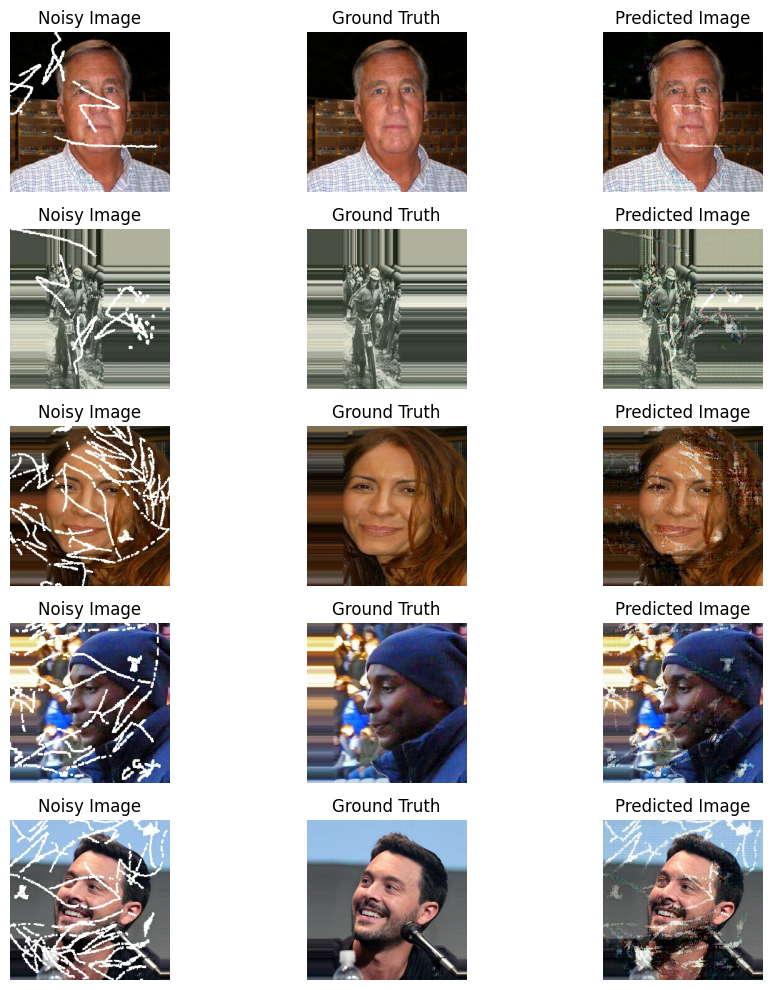

Time: 139.1579179763794 sec, gen loss = 545.30908203125, disc loss = 124.55907440185547.
Epoch:  21
Time: 137.34271502494812 sec, gen loss = 500.40252685546875, disc loss = 135.51040649414062.
Epoch:  22
Time: 137.05810546875 sec, gen loss = 454.07110595703125, disc loss = 139.09046936035156.
Epoch:  23
Time: 136.98456645011902 sec, gen loss = 583.9978637695312, disc loss = 122.61800384521484.
Epoch:  24
Time: 136.9170434474945 sec, gen loss = 509.91162109375, disc loss = 127.90432739257812.
Epoch:  25
Time: 137.04161930084229 sec, gen loss = 479.52337646484375, disc loss = 130.0087127685547.
Epoch:  26
Time: 137.53017568588257 sec, gen loss = 504.0968017578125, disc loss = 134.15765380859375.
Epoch:  27
Time: 136.81001591682434 sec, gen loss = 505.185546875, disc loss = 132.33509826660156.
Epoch:  28
Time: 136.49911904335022 sec, gen loss = 434.7266540527344, disc loss = 132.16204833984375.
Epoch:  29
Time: 136.78895711898804 sec, gen loss = 512.3151245117188, disc loss = 132.90303039

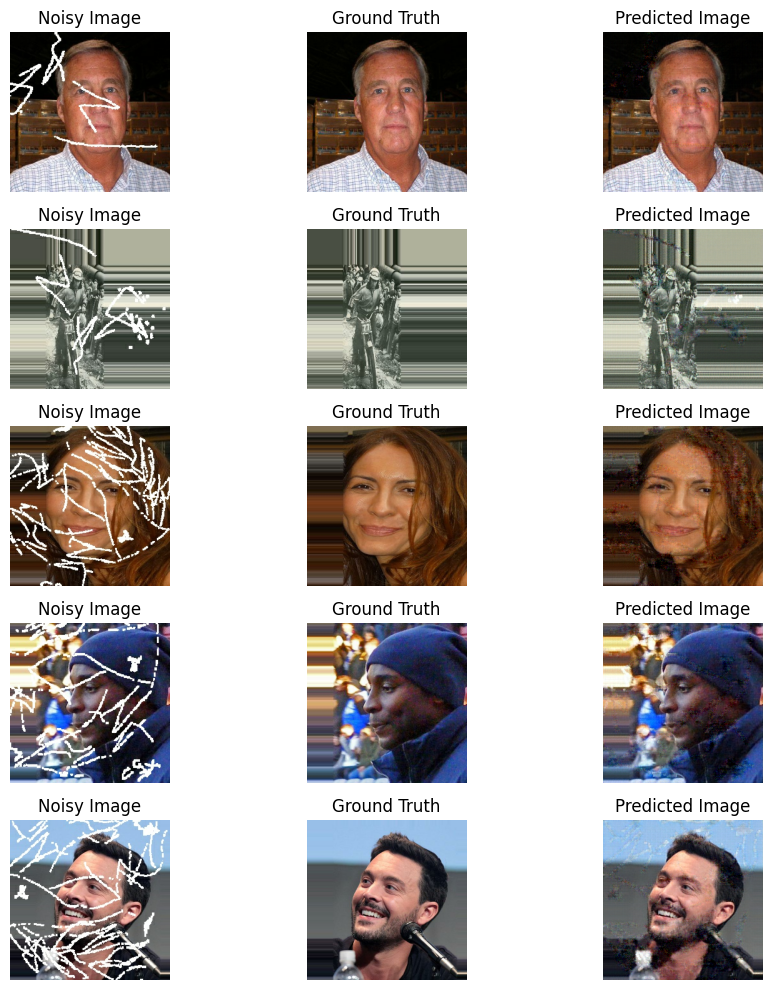

Time: 139.76030445098877 sec, gen loss = 480.6966552734375, disc loss = 128.09616088867188.
Epoch:  31
Time: 136.43308806419373 sec, gen loss = 459.5679626464844, disc loss = 134.56976318359375.
Epoch:  32
Time: 136.67709469795227 sec, gen loss = 602.7528076171875, disc loss = 108.26580047607422.
Epoch:  33
Time: 137.42184925079346 sec, gen loss = 422.046142578125, disc loss = 132.70480346679688.
Epoch:  34
Time: 136.4911506175995 sec, gen loss = 546.6373901367188, disc loss = 117.30001068115234.
Epoch:  35
Time: 136.2838053703308 sec, gen loss = 544.2523803710938, disc loss = 116.84709930419922.
Epoch:  36
Time: 136.27813911437988 sec, gen loss = 452.8515930175781, disc loss = 126.26225280761719.
Epoch:  37
Time: 136.08751893043518 sec, gen loss = 468.8296203613281, disc loss = 128.3604736328125.
Epoch:  38
Time: 136.1510512828827 sec, gen loss = 621.7933349609375, disc loss = 110.31036376953125.
Epoch:  39
Time: 136.21214365959167 sec, gen loss = 417.43988037109375, disc loss = 124.6

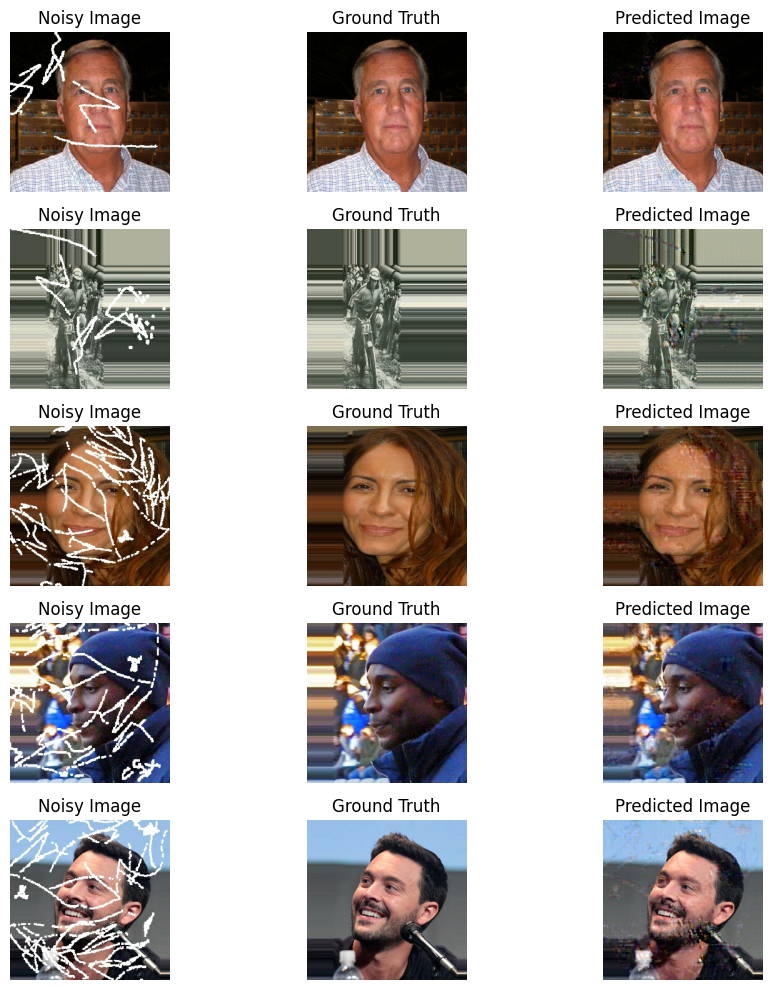

Time: 138.47828936576843 sec, gen loss = 470.6795959472656, disc loss = 129.8453369140625.
Epoch:  41
Time: 136.25235795974731 sec, gen loss = 494.72833251953125, disc loss = 120.27740478515625.
Epoch:  42
Time: 136.17900156974792 sec, gen loss = 461.2047424316406, disc loss = 120.78539276123047.
Epoch:  43
Time: 136.33792209625244 sec, gen loss = 630.781005859375, disc loss = 101.52901458740234.
Epoch:  44
Time: 136.52213978767395 sec, gen loss = 502.7801208496094, disc loss = 112.73419952392578.
Epoch:  45
Time: 136.88327145576477 sec, gen loss = 432.78521728515625, disc loss = 126.35102844238281.
Epoch:  46
Time: 136.58768153190613 sec, gen loss = 465.14044189453125, disc loss = 122.29440307617188.
Epoch:  47
Time: 136.2972128391266 sec, gen loss = 471.44915771484375, disc loss = 121.08222961425781.
Epoch:  48
Time: 136.19047808647156 sec, gen loss = 466.33038330078125, disc loss = 118.53824615478516.
Epoch:  49
Time: 136.2455973625183 sec, gen loss = 492.9220275878906, disc loss = 

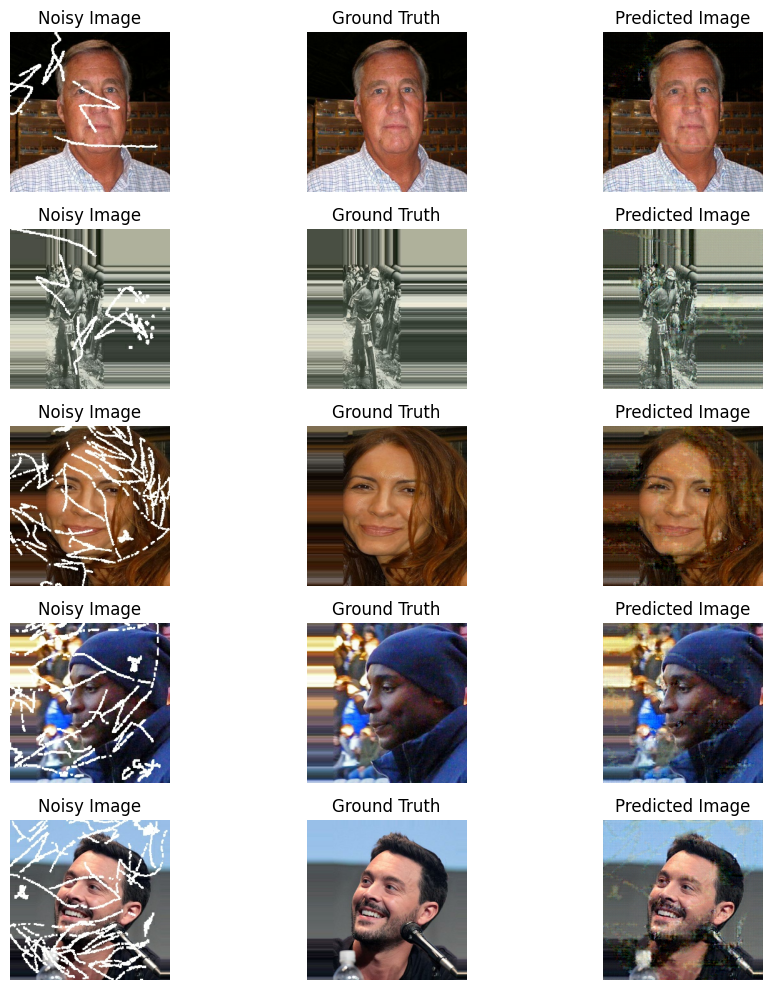

Time: 138.27379155158997 sec, gen loss = 624.34521484375, disc loss = 97.74594116210938.
Epoch:  51
Time: 136.24326753616333 sec, gen loss = 434.68377685546875, disc loss = 111.95589447021484.
Epoch:  52
Time: 136.49759030342102 sec, gen loss = 572.804931640625, disc loss = 116.70486450195312.
Epoch:  53
Time: 136.47680950164795 sec, gen loss = 434.7862243652344, disc loss = 112.64724731445312.
Epoch:  54
Time: 136.4025640487671 sec, gen loss = 452.8436279296875, disc loss = 111.15123748779297.
Epoch:  55
Time: 136.0551300048828 sec, gen loss = 448.7936096191406, disc loss = 131.3559112548828.
Epoch:  56
Time: 136.29941654205322 sec, gen loss = 482.6037292480469, disc loss = 107.4478530883789.
Epoch:  57
Time: 136.2360656261444 sec, gen loss = 464.1606140136719, disc loss = 116.84803009033203.
Epoch:  58
Time: 136.2277708053589 sec, gen loss = 465.8026428222656, disc loss = 110.99678802490234.
Epoch:  59
Time: 136.4220700263977 sec, gen loss = 550.485107421875, disc loss = 106.13794708

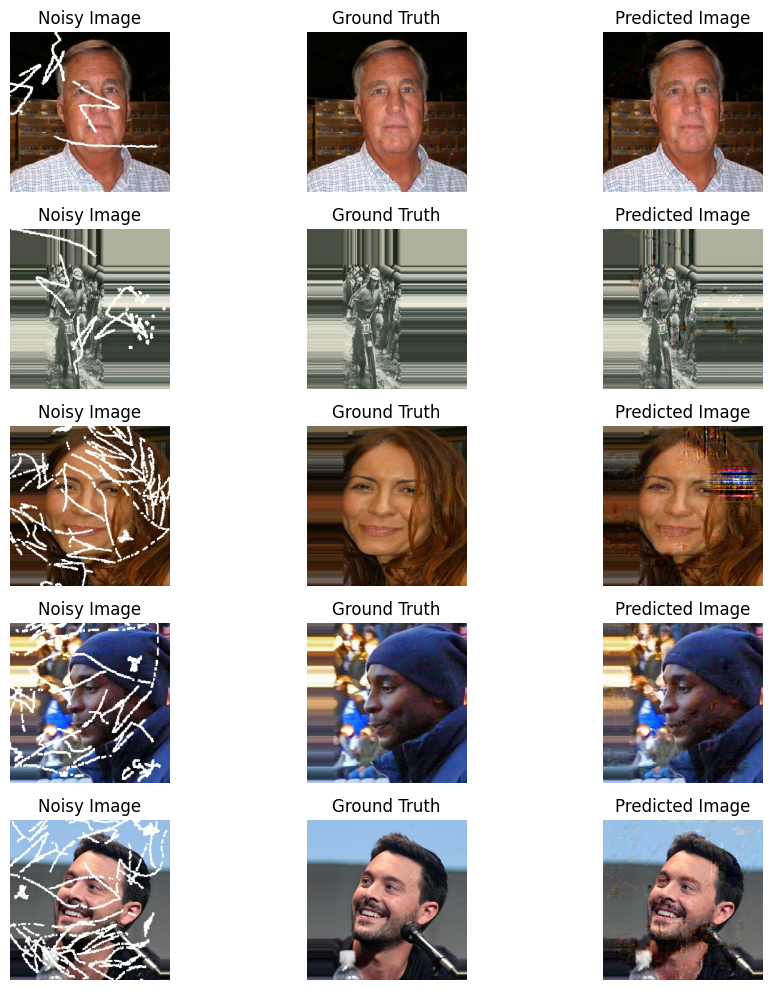

Time: 138.38134717941284 sec, gen loss = 461.5959777832031, disc loss = 122.46475982666016.
Epoch:  61
Time: 135.650874376297 sec, gen loss = 474.4892578125, disc loss = 120.03274536132812.
Epoch:  62
Time: 135.92124724388123 sec, gen loss = 424.9160461425781, disc loss = 112.7432632446289.
Epoch:  63
Time: 136.1981987953186 sec, gen loss = 505.7965087890625, disc loss = 105.97134399414062.
Epoch:  64
Time: 137.71812868118286 sec, gen loss = 462.0257263183594, disc loss = 111.28226470947266.
Epoch:  65
Time: 137.64846396446228 sec, gen loss = 506.8149719238281, disc loss = 115.17799377441406.
Epoch:  66
Time: 137.78288316726685 sec, gen loss = 469.90740966796875, disc loss = 114.96746826171875.
Epoch:  67
Time: 137.32132935523987 sec, gen loss = 427.35638427734375, disc loss = 108.95903778076172.
Epoch:  68
Time: 137.22922444343567 sec, gen loss = 511.43365478515625, disc loss = 120.4448471069336.
Epoch:  69
Time: 136.8189616203308 sec, gen loss = 535.1336059570312, disc loss = 112.979

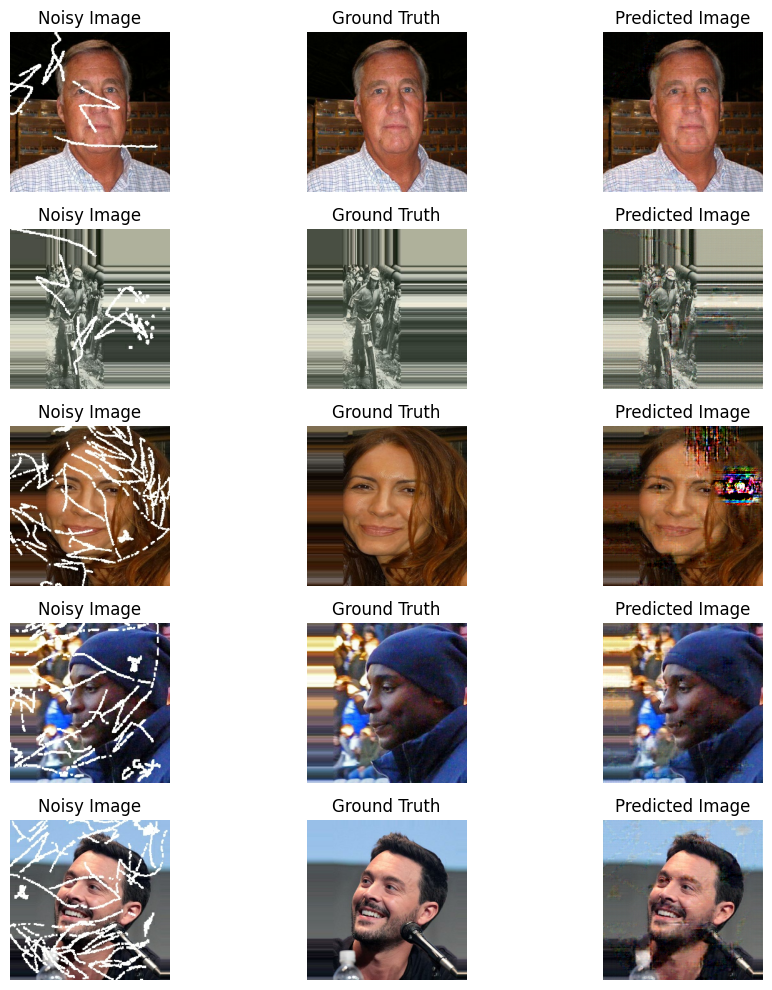

Time: 138.45880818367004 sec, gen loss = 463.47344970703125, disc loss = 107.05201721191406.
Epoch:  71
Time: 136.2835111618042 sec, gen loss = 476.21051025390625, disc loss = 118.30774688720703.
Epoch:  72
Time: 136.12024593353271 sec, gen loss = 479.832763671875, disc loss = 109.05043029785156.
Epoch:  73
Time: 136.7283899784088 sec, gen loss = 453.706298828125, disc loss = 108.17767333984375.
Epoch:  74
Time: 138.00901579856873 sec, gen loss = 489.7806701660156, disc loss = 116.01105499267578.
Epoch:  75
Time: 137.44400000572205 sec, gen loss = 483.6149597167969, disc loss = 116.66102600097656.
Epoch:  76
Time: 136.66130018234253 sec, gen loss = 519.4713745117188, disc loss = 100.94672393798828.
Epoch:  77
Time: 136.914448261261 sec, gen loss = 459.44091796875, disc loss = 113.63203430175781.
Epoch:  78
Time: 136.9680688381195 sec, gen loss = 442.209716796875, disc loss = 115.02271270751953.
Epoch:  79
Time: 136.17240285873413 sec, gen loss = 454.94378662109375, disc loss = 107.7026

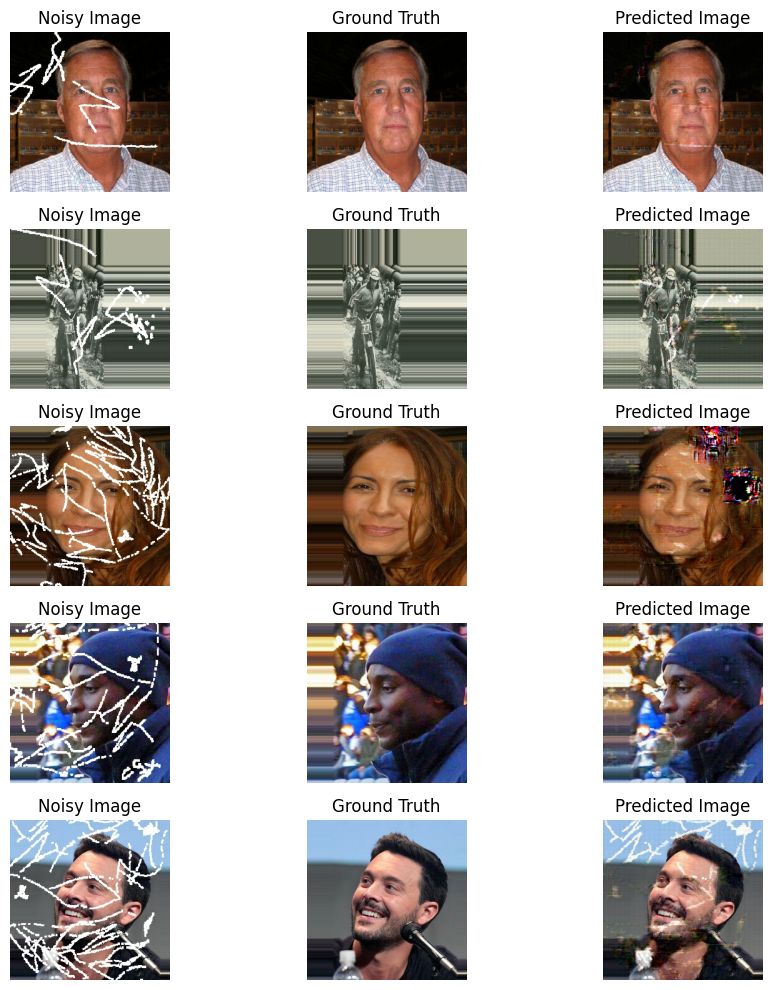

Time: 137.91754150390625 sec, gen loss = 503.9330749511719, disc loss = 114.39009094238281.
Epoch:  81
Time: 135.98998165130615 sec, gen loss = 458.2580261230469, disc loss = 110.70197296142578.
Epoch:  82
Time: 135.5569236278534 sec, gen loss = 423.8857727050781, disc loss = 115.07305145263672.
Epoch:  83
Time: 135.28921937942505 sec, gen loss = 466.7297058105469, disc loss = 114.39878845214844.
Epoch:  84
Time: 135.4001452922821 sec, gen loss = 455.79412841796875, disc loss = 111.74346160888672.
Epoch:  85
Time: 135.61001467704773 sec, gen loss = 448.439208984375, disc loss = 117.0589370727539.
Epoch:  86
Time: 135.49249696731567 sec, gen loss = 426.8549499511719, disc loss = 106.68592071533203.
Epoch:  87
Time: 135.53996872901917 sec, gen loss = 449.25738525390625, disc loss = 112.3116455078125.
Epoch:  88
Time: 135.46966981887817 sec, gen loss = 489.49017333984375, disc loss = 115.3220443725586.
Epoch:  89
Time: 135.56323719024658 sec, gen loss = 498.4855041503906, disc loss = 108.

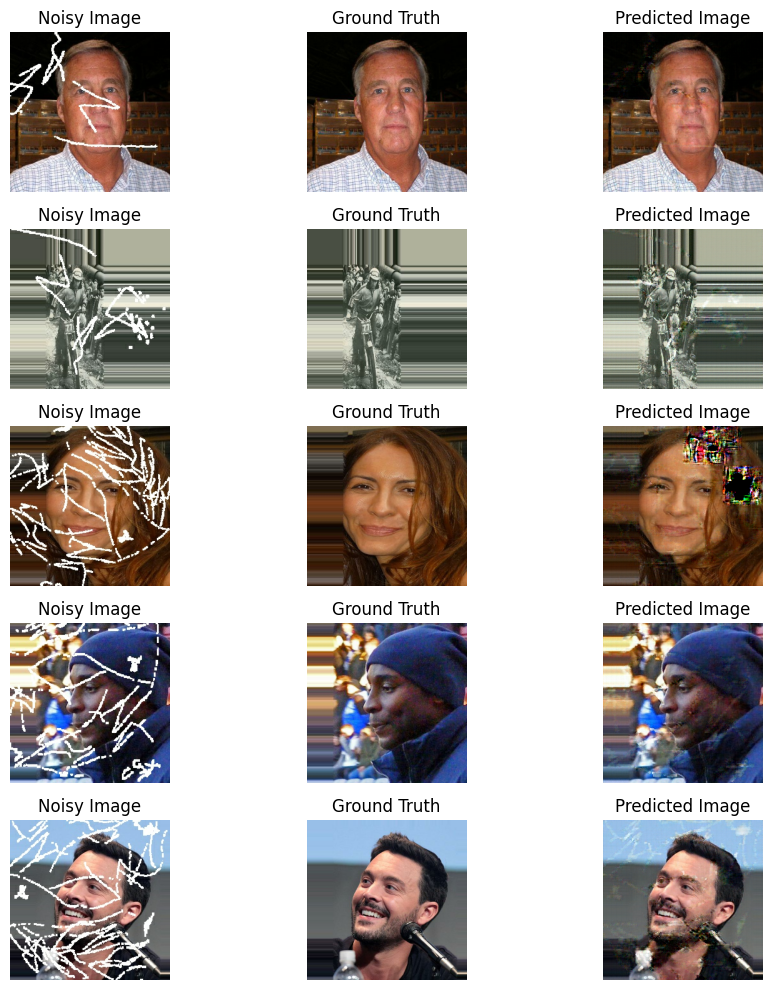

Time: 137.76571941375732 sec, gen loss = 541.5789794921875, disc loss = 100.09513854980469.
Epoch:  91
Time: 135.3821120262146 sec, gen loss = 450.99609375, disc loss = 106.2973861694336.
Epoch:  92
Time: 135.46876454353333 sec, gen loss = 472.9900817871094, disc loss = 109.43061828613281.
Epoch:  93
Time: 135.4145290851593 sec, gen loss = 475.2792053222656, disc loss = 101.97620391845703.
Epoch:  94
Time: 135.8625648021698 sec, gen loss = 493.0587158203125, disc loss = 103.37202453613281.
Epoch:  95
Time: 135.56909728050232 sec, gen loss = 455.3543395996094, disc loss = 110.015869140625.
Epoch:  96
Time: 135.5216555595398 sec, gen loss = 481.0028076171875, disc loss = 111.29816436767578.
Epoch:  97
Time: 136.583345413208 sec, gen loss = 450.62353515625, disc loss = 105.87728118896484.
Epoch:  98
Time: 136.27840900421143 sec, gen loss = 453.9942932128906, disc loss = 113.65364837646484.
Epoch:  99
Time: 135.18864345550537 sec, gen loss = 434.6662902832031, disc loss = 103.3760604858398

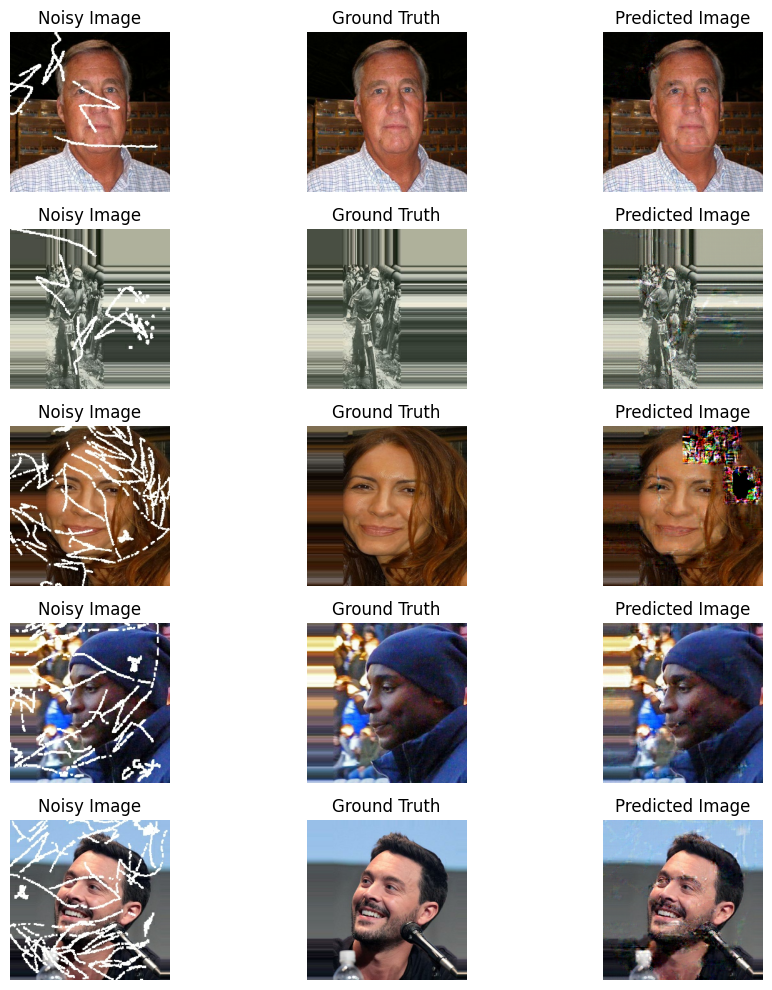

Time: 137.789137840271 sec, gen loss = 498.6434020996094, disc loss = 122.16629791259766.


In [16]:
fit(train_dataset, epochs = 100)

## 7. Evaluation

In [17]:
from PIL import Image

def transform_image(image):
    maximum = np.max(image)
    image = image/maximum*255
    image = np.array(image).astype('uint8')
    return image

### 7.1 Initial values of metrics between noisy and clear image

In [18]:
from skimage.metrics import mean_squared_error, normalized_root_mse, structural_similarity
mse = 0
nrmse = 0
ssim = 0
total_images = 0
for n, (target, input_image) in tqdm(test_dataset.enumerate()):
    total_images += target.shape[0]
    for i in range(target.shape[0]):
        t_im = transform_image(target[i])
        p_im = transform_image(input_image[i])
        mse += mean_squared_error(t_im, p_im)
        nrmse += normalized_root_mse(t_im, p_im)
        ssim += structural_similarity(t_im, p_im, channel_axis=2)
mse /= total_images
nrmse /= total_images
ssim /= total_images

print(mse, nrmse, ssim)

100%|██████████| 13/13 [00:17<00:00,  1.37s/it]

2522.916588378106 0.4052747850337342 0.7540380235874763


### 7.2 Final values of metrics between generated and clear image

In [19]:
from skimage.metrics import mean_squared_error, normalized_root_mse, structural_similarity
mse = 0
nrmse = 0
ssim = 0
total_images = 0
for n, (target, input_image) in tqdm(test_dataset.enumerate()):
    predicted_images = generator(input_image)
    total_images += target.shape[0]
    for i in range(target.shape[0]):
        t_im = transform_image(target[i])
        p_im = transform_image(predicted_images[i])
        mse += mean_squared_error(t_im, p_im)
        nrmse += normalized_root_mse(t_im, p_im)
        ssim += structural_similarity(t_im, p_im, channel_axis=2)
mse /= total_images
nrmse /= total_images
ssim /= total_images

print(mse, nrmse, ssim)

100%|██████████| 13/13 [00:19<00:00,  1.53s/it]

493.3607721640395 0.16090540398949443 0.8436575980695341
